In [ ]:
!wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
!tar -xvzf food-101.tar.gz

--2025-06-15 11:31:10--  http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz [following]
--2025-06-15 11:31:11--  https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4996278331 (4.7G) [application/x-gzip]
Saving to: ‘food-101.tar.gz’

food-101.tar.gz     100%[===================>]   4.65G  31.2MB/s    in 2m 52s  

2025-06-15 11:34:03 (27.7 MB/s) - ‘food-101.tar.gz’ saved [4996278331/4996278331]

food-101/
food-101/images/
food-101/images/beignets/
food-101/images/beignets/2885220.jpg
food-101/images/beignets/1814040.jpg
food-101/images/bei

In [3]:
import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [4]:
base_path = 'food-101'
print(os.listdir(base_path))

['README.txt', 'license_agreement.txt', 'meta', 'images']


In [5]:
print(os.listdir('food-101/images'))

['pizza', 'hot_dog', 'hummus', 'seaweed_salad', 'pad_thai', 'garlic_bread', 'ravioli', 'baby_back_ribs', 'gnocchi', 'hot_and_sour_soup', 'deviled_eggs', 'strawberry_shortcake', 'poutine', 'samosa', 'shrimp_and_grits', 'fried_rice', 'grilled_salmon', 'spaghetti_bolognese', 'beef_carpaccio', 'edamame', 'sashimi', 'pancakes', 'chocolate_cake', 'cup_cakes', 'clam_chowder', 'spring_rolls', 'tiramisu', 'creme_brulee', 'cheesecake', 'steak', 'oysters', 'onion_rings', 'gyoza', 'baklava', 'paella', 'lasagna', 'carrot_cake', 'grilled_cheese_sandwich', 'pork_chop', 'lobster_bisque', 'pulled_pork_sandwich', 'filet_mignon', 'miso_soup', 'falafel', 'breakfast_burrito', 'omelette', 'apple_pie', 'spaghetti_carbonara', 'crab_cakes', 'takoyaki', 'french_onion_soup', 'chicken_quesadilla', 'french_fries', 'ceviche', 'mussels', 'churros', 'chicken_wings', 'beignets', 'bread_pudding', 'foie_gras', 'risotto', 'dumplings', 'guacamole', 'cannoli', 'caprese_salad', 'prime_rib', 'peking_duck', 'club_sandwich', '

In [6]:
print(os.listdir('food-101/meta'))

['labels.txt', 'classes.txt', 'train.txt', 'train.json', 'test.json', 'test.txt']


In [6]:
!head food-101/meta/train.txt

apple_pie/1005649
apple_pie/1014775
apple_pie/1026328
apple_pie/1028787
apple_pie/1043283
apple_pie/1050519
apple_pie/1057749
apple_pie/1057810
apple_pie/1072416
apple_pie/1074856


In [7]:
!head food-101/meta/test.txt

apple_pie/1011328
apple_pie/101251
apple_pie/1034399
apple_pie/103801
apple_pie/1038694
apple_pie/1047447
apple_pie/1068632
apple_pie/110043
apple_pie/1106961
apple_pie/1113017


In [9]:
!head food-101/meta/labels.txt

Apple pie
Baby back ribs
Baklava
Beef carpaccio
Beef tartare
Beet salad
Beignets
Bibimbap
Bread pudding
Breakfast burrito


In [10]:
!head food-101/meta/classes.txt

apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito


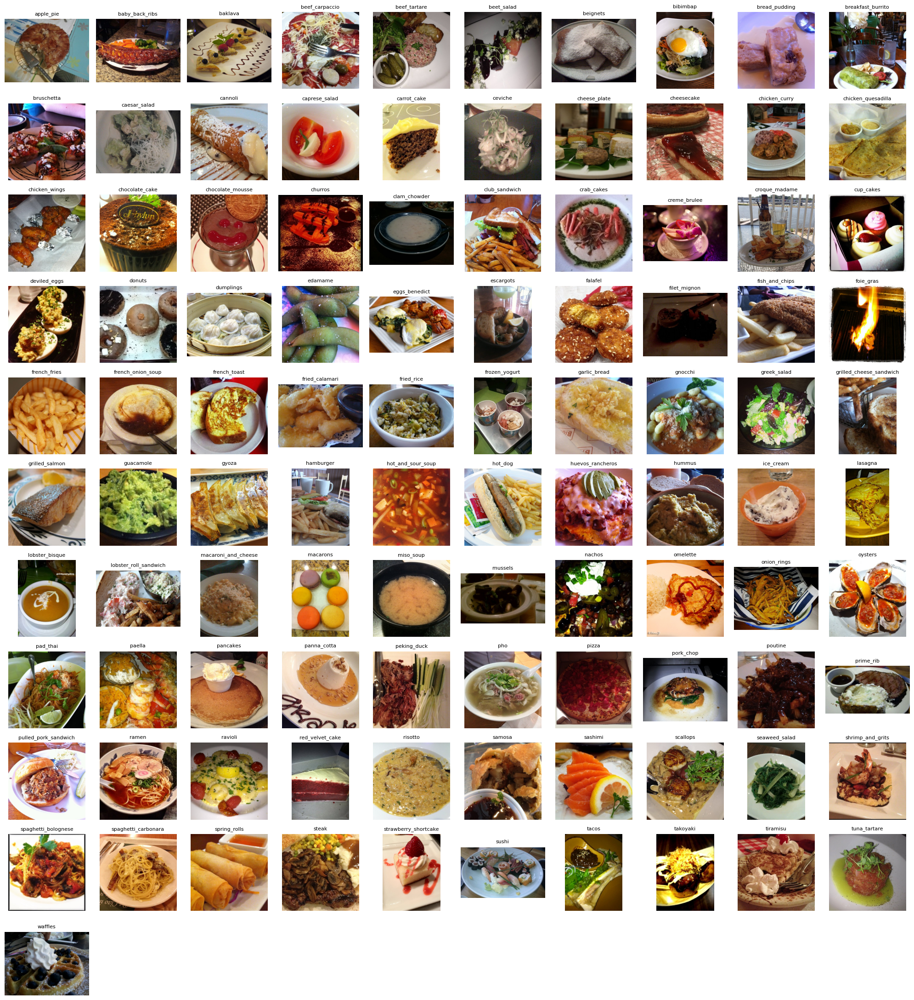

In [7]:
from PIL import Image

image_dir = 'food-101/images'

categories = [d for d in os.listdir(image_dir) if os.path.isdir(os.path.join(image_dir, d))]

rows, cols = 11, 10
plt.figure(figsize=(20, 22))

for idx, category in enumerate(sorted(categories)):
    category_path = os.path.join(image_dir, category)

    image_files = [f for f in os.listdir(category_path) if f.endswith('.jpg') and not f.startswith('._')]

    random_file = random.choice(image_files)
    img_path = os.path.join(category_path, random_file)

    img = Image.open(img_path)
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.title(category, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [8]:
import pandas as pd
import os

with open('food-101/meta/classes.txt') as f:
    class_names = [line.strip() for line in f]
class_to_label = {name: idx for idx, name in enumerate(class_names)}

def txt_to_dataframe(txt_path, base_dir='food-101/images'):
    with open(txt_path) as f:
        lines = [line.strip() for line in f]
    data = []
    for line in lines:
        class_name = line.split('/')[0]
        full_path = os.path.join(base_dir, line + '.jpg')
        data.append((full_path, class_name))
    return pd.DataFrame(data, columns=['filename', 'class'])

train_df = txt_to_dataframe('food-101/meta/train.txt')
test_df = txt_to_dataframe('food-101/meta/test.txt')

print(f"Jumlah data train: {len(train_df)}")
print(f"Jumlah data test : {len(test_df)}")

Jumlah data train: 75750
Jumlah data test : 25250


In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split


datagen = ImageDataGenerator(rescale=1./255)

train_df, val_df = train_test_split(
    train_df,
    test_size=0.2,
    stratify=train_df['class'],
    random_state=42
)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 60600 validated image filenames belonging to 101 classes.
Found 15150 validated image filenames belonging to 101 classes.
Found 25250 validated image filenames belonging to 101 classes.


In [10]:
from tensorflow.keras import layers, models, regularizers

l2_reg = regularizers.l2(0.001) # Faktor regularisasi L2

model = models.Sequential([
    # Block 1
    layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                  input_shape=(224, 224, 3),
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2_reg),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Block 2
    layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2_reg),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.25),

    # Block 3
    layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2_reg),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.3),

    # Block 4
    layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2_reg),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.4),

    # Global Average Pooling
    layers.GlobalAveragePooling2D(),

    # Dense 
    layers.Dense(512, activation='relu',
                 kernel_initializer='he_normal',
                 kernel_regularizer=l2_reg),
    layers.BatchNormalization(),
    layers.Dropout(0.5),

    # Output layer
    layers.Dense(101, activation='softmax',
                 kernel_initializer='glorot_uniform')
])

# Kompilasi model
model.compile(optimizer=Adam(learning_rate=0.0005),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1749987645.785885      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 575,781 (2.20 MB)

 Trainable params: 573,797 (2.19 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [11]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ModelCheckpoint('best_model_food101.h5', save_best_only=True)
]

history = model.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    callbacks=callbacks
)

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1749987659.281235      86 service.cc:148] XLA service 0x79519c119d50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749987659.282108      86 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1749987659.877628      86 cuda_dnn.cc:529] Loaded cuDNN version 90300


   3/1894 ━━━━━━━━━━━━━━━━━━━━ 1:57 62ms/step - accuracy: 0.0000e+00 - loss: 7.9129  

I0000 00:00:1749987667.582246      86 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1894/1894 ━━━━━━━━━━━━━━━━━━━━ 191s 93ms/step - accuracy: 0.0339 - loss: 6.7602 - val_accuracy: 0.0803 - val_loss: 5.4672 - learning_rate: 5.0000e-04
Epoch 2/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 159s 84ms/step - accuracy: 0.1026 - loss: 5.1490 - val_accuracy: 0.1390 - val_loss: 4.5275 - learning_rate: 5.0000e-04
Epoch 3/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 168s 89ms/step - accuracy: 0.1780 - loss: 4.1998 - val_accuracy: 0.1493 - val_loss: 4.4098 - learning_rate: 5.0000e-04
Epoch 4/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 168s 88ms/step - accuracy: 0.2532 - loss: 3.6582 - val_accuracy: 0.2933 - val_loss: 3.4412 - learning_rate: 5.0000e-04
Epoch 5/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 167s 88ms/step - accuracy: 0.3006 - loss: 3.3667 - val_accuracy: 0.2963 - val_loss: 3.4756 - learning_rate: 5.0000e-04
Epoch 6/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 161s 85ms/step - accuracy: 0.3371 - loss: 3.1927 - val_accuracy: 0.3444 - val_loss: 3.2365 - learning_rate: 5.0000e-04
Epoch 7/30
1894/1894 ━━━━━━━━━━━━━━━━━━━━ 168

In [12]:
# Evaluate on test set
test_loss, test_acc = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_acc:.4f}")

790/790 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.6048 - loss: 1.9033

Test Accuracy: 0.6243


In [26]:
from sklearn.metrics import classification_report

report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print(report)


                         precision    recall  f1-score   support

              apple_pie       0.48      0.22      0.30       250
         baby_back_ribs       0.64      0.65      0.65       250
                baklava       0.46      0.79      0.58       250
         beef_carpaccio       0.79      0.75      0.77       250
           beef_tartare       0.60      0.65      0.62       250
             beet_salad       0.77      0.43      0.55       250
               beignets       0.72      0.80      0.76       250
               bibimbap       0.81      0.81      0.81       250
          bread_pudding       0.38      0.37      0.37       250
      breakfast_burrito       0.51      0.32      0.39       250
             bruschetta       0.55      0.60      0.57       250
           caesar_salad       0.79      0.70      0.75       250
                cannoli       0.63      0.46      0.54       250
          caprese_salad       0.66      0.68      0.67       250
            carrot_cake 

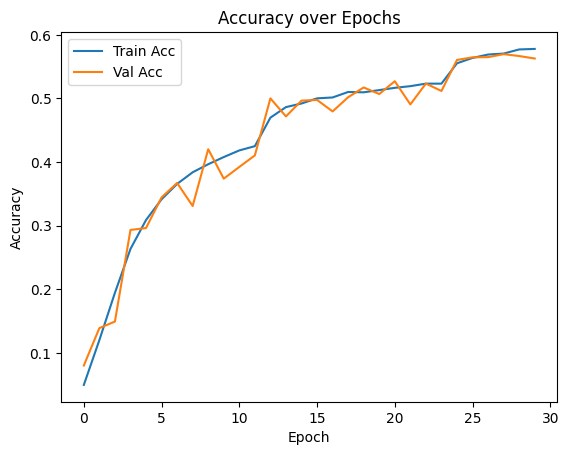

In [20]:
#Plot accuracy

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

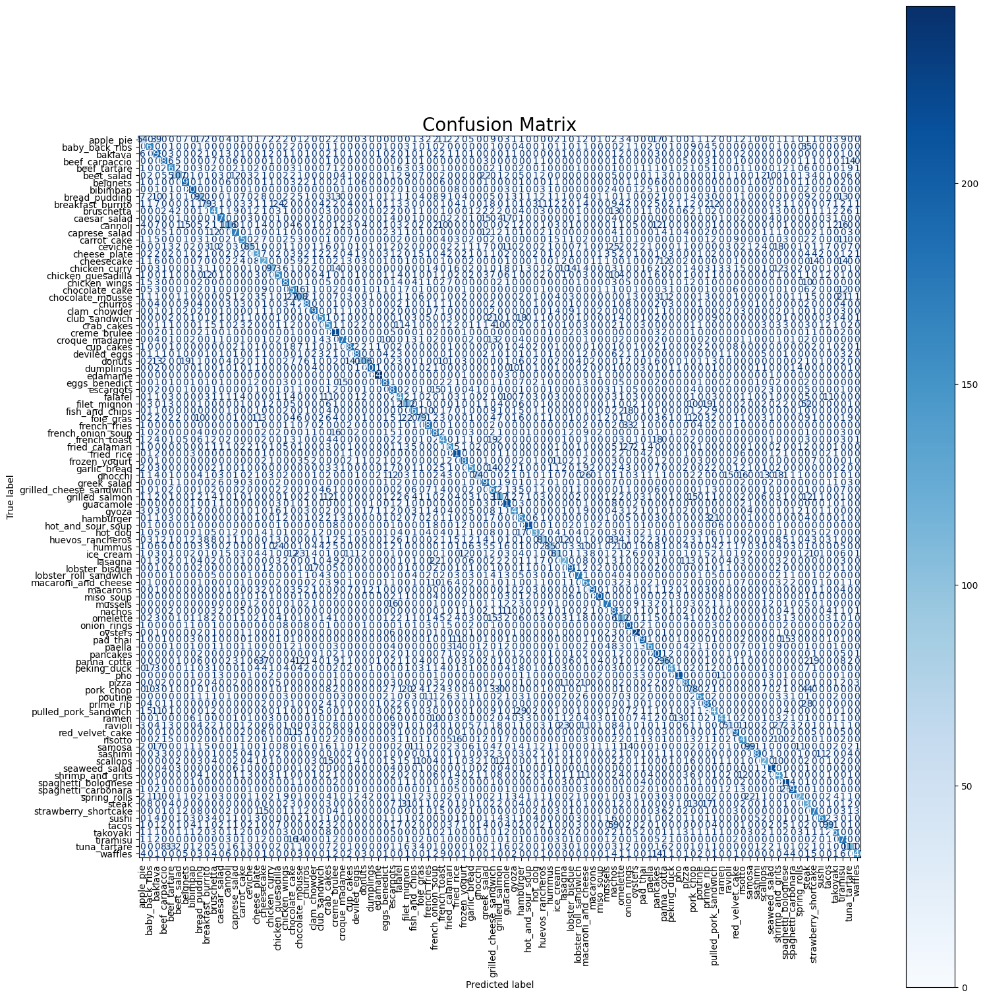

In [25]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 16)) 
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(
    cmap=plt.cm.Blues, 
    xticks_rotation=90,  
    ax=plt.gca()
)
plt.title("Confusion Matrix", fontsize=20)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()  
plt.show()
